# Week10: Visual Object Tracking (VOT)

## Application of Convolution Theorem

In [64]:
import numpy as np
from matplotlib import pyplot as plt
import os
import numpy as np
import cv2
from typing import Iterable

In [2]:
def plot_signals(x, y, z, t, t_conv):
    plt.figure(figsize=(20, 10))
    ax = plt.subplot(121) 
    plt.plot(t, x)
    plt.plot(t, y)
    plt.plot(t_conv, z)
    plt.legend(['$x(t)$', '$y(t)$', '$z(t)$'])

In [24]:
def convolve_fft(x: Iterable[float], y: Iterable[float]) -> Iterable[float]:
    """Returns convolution result calculated by Convolution Theorem

    Calculate convolution of two signals `x` and `y` by multiplying them in
    frequency domain

    Parameters
    ----------
    x: first signal
    y: second signal

    Returns
    -------
    Iterable[float]
    Convoluted signal, which has length L1 + L2 - 1 where L1 is 
    the length of `x` and L2 is the length of `y`
    """
    
    if type(x) != np.ndarray:
        x = np.array(x)

    if type(y) != np.ndarray:
        y = np.array(y)

    L1 = x.shape[0]
    L2 = y.shape[0]

    LConv = L1 + L2 - 1

    # ==========Answer Starts==========
    pass
    # ==========Answer Ends==========


### Test the implementation

In [25]:
N = 128
n = np.arange(N)
n_conv = np.arange(2*N)[:-1]

x_samples = np.exp(-0.05*n)
y_samples = np.sin(2*np.pi*n/16)
z_samples = np.convolve(x_samples, y_samples)

### Plot convolution

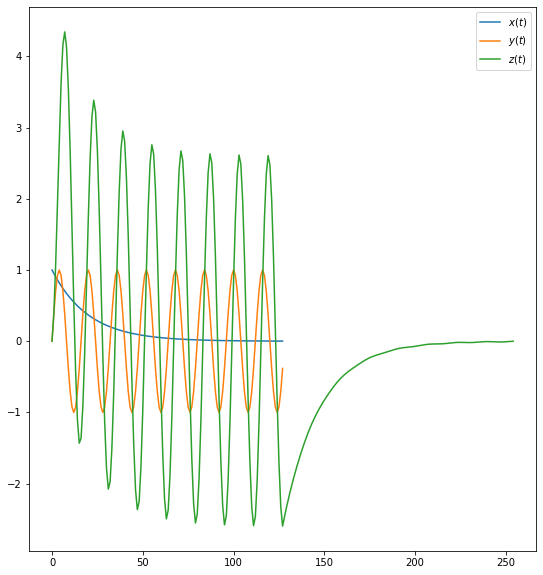

In [ ]:
plot_signals(x_samples, y_samples, z_samples, n, n_conv)

Plot convolution results calculated by your function:

In [1]:
z2_samples = convolve_fft(x_samples, y_samples)

NameError: name 'convolve_fft' is not defined

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)


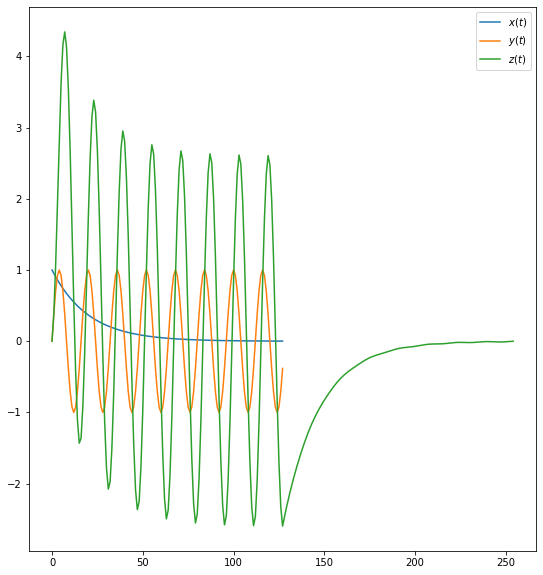

In [ ]:
plot_signals(x_samples, y_samples, z2_samples, n, n_conv)

## MOSSE

In [65]:
#Set this variable to True if working on Colab, False otherwise
is_colab = False

In [66]:
if is_colab:
    from google.colab.patches import cv2_imshow
import imageio

In [67]:
# used for linear mapping...
def linear_mapping(img):
    return (img - img.min()) / (img.max() - img.min())

# pre-processing the image...
def pre_process(img):
    # get the size of the img...
    height, width = img.shape
    img = np.log(img + 1)
    img = (img - np.mean(img)) / (np.std(img) + 1e-5)
    # use the hanning window...
    window = window_func_2d(height, width)
    img = img * window

    return img

def window_func_2d(height, width):
    win_col = np.hanning(width)
    win_row = np.hanning(height)
    mask_col, mask_row = np.meshgrid(win_col, win_row)

    win = mask_col * mask_row

    return win


In [68]:
# pre train the filter on the first frame...
def pre_training(init_frame, G, num_pretrain=128):
    height, width = G.shape
    fi = cv2.resize(init_frame, (width, height))
    # pre-process img..
    fi = pre_process(fi)
    Ai = G * np.conjugate(np.fft.fft2(fi))
    Bi = np.fft.fft2(init_frame) * np.conjugate(np.fft.fft2(init_frame))
    for _ in range(num_pretrain):
        fi = pre_process(init_frame)
        Ai = Ai + G * np.conjugate(np.fft.fft2(fi))
        Bi = Bi + np.fft.fft2(fi) * np.conjugate(np.fft.fft2(fi))
    
    return Ai, Bi

In [69]:
# get the ground-truth gaussian reponse...
def get_gauss_response(img, gt, sigma=100):
    # get the shape of the image..
    height, width = img.shape
    # get the mesh grid...
    xx, yy = np.meshgrid(np.arange(width), np.arange(height))
    # get the center of the object...
    center_x = gt[0] + 0.5 * gt[2]
    center_y = gt[1] + 0.5 * gt[3]
    # cal the distance...
    dist = (np.square(xx - center_x) + np.square(yy - center_y)) / (2 * sigma)
    # get the response map...
    response = np.exp(-dist)
    # normalize...
    response = linear_mapping(response)
    return response

In [70]:
def get_img_lists(img_path):
    frame_list = []
    for frame in os.listdir(img_path):
        if os.path.splitext(frame)[1] == '.jpg':
            frame_list.append(os.path.join(img_path, frame)) 
    return frame_list

In [75]:
# start to do the object tracking...
def start_tracking(frame_lists, lr=0.125):
    frames = [] #for creating the gif
    # get the image of the first frame... (read as gray scale image...)
    init_img = cv2.imread(frame_lists[0])
    init_frame = cv2.cvtColor(init_img, cv2.COLOR_BGR2GRAY)
    init_frame = init_frame.astype(np.float32)
    # get the init ground truth.. [x, y, width, height]
    # Not supported by Colab but works locally
    # init_gt = cv2.selectROI('demo', init_img, False, False)
    init_gt = (142, 19, 87, 120) # Note that it would only work for specific example, baby
    init_gt = np.array(init_gt).astype(np.int64)
    # start to draw the gaussian response...
    response_map = get_gauss_response(init_frame, init_gt)
    # start to create the training set ...
    # get the goal..
    g = response_map[init_gt[1]:init_gt[1]+init_gt[3], init_gt[0]:init_gt[0]+init_gt[2]]
    fi = init_frame[init_gt[1]:init_gt[1]+init_gt[3], init_gt[0]:init_gt[0]+init_gt[2]]
    G = np.fft.fft2(g)
    # start to do the pre-training...
    Ai, Bi = pre_training(fi, G)
    # start the tracking...
    for idx in range(len(frame_lists)):
        current_frame = cv2.imread(frame_lists[idx])
        frame_gray = cv2.cvtColor(current_frame, cv2.COLOR_BGR2GRAY)
        frame_gray = frame_gray.astype(np.float32)
        if idx == 0:
            Ai = lr * Ai
            Bi = lr * Bi
            pos = init_gt.copy()
            clip_pos = np.array([pos[0], pos[1], pos[0]+pos[2], pos[1]+pos[3]]).astype(np.int64)
        else:
            # ==========Answer Starts===========
            Hi = None
            fi = None
            Gi = None
            gi = None

            # find the max pos...
            max_pos = None
            dy = None
            dx = None
            
            # update the position...
            pos[0] = None
            pos[1] = None

            # get the clipped position [xmin, ymin, xmax, ymax]
            clip_pos[0] = None
            clip_pos[1] = None
            clip_pos[2] = None
            clip_pos[3] = None
            clip_pos = clip_pos.astype(np.int64)

            # get the current fi..
            fi = None
            fi = None
            # online update...
            Ai = None
            Bi = None
        
            # ==========Answer Ends===========
        # visualize the tracking process...
        cv2.rectangle(current_frame, (pos[0], pos[1]), (pos[0]+pos[2], pos[1]+pos[3]), (255, 0, 0), 2)
        frames.append(cv2.cvtColor(current_frame, cv2.COLOR_BGR2RGB))
        
        if is_colab:
            cv2_imshow(current_frame)
        else:
            cv2.imshow('frame', current_frame)
        cv2.waitKey(100)
        
    if not is_colab:
        cv2.destroyAllWindows()
    with imageio.get_writer("baby-records.gif", mode="I") as writer:
        for idx, frame in enumerate(frames):
            writer.append_data(frame)

In [72]:
img_path = "baby"
zip_file = "07614442490909912079a19f770193f24e5cea6fc98febf97f06354e0cdac257aeb023016acdd1fdde2ae43d8d8024be00059ca49c3d8859b427ae0a32fac2ba"

In [ ]:
!wget https://data.votchallenge.net/sequences/{zip_file}.zip
!mkdir {img_path}
!unzip {zip_file}.zip -d {img_path}

In [73]:
frame_lists = get_img_lists(img_path)
frame_lists.sort()

In [ ]:
start_tracking(frame_lists)

### Result as Gif

In [42]:
from IPython.display import Image

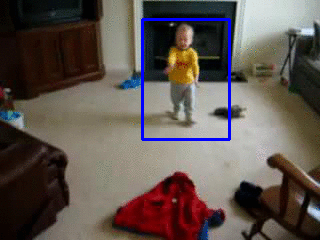

In [ ]:
Image(open('baby-records.gif','rb').read())

**Note**: Please include the resulting gif file in your zip file when uploading your solution. 